In [7]:
# 1. Imports y configuración inicial
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from skimage import feature, filters, segmentation, color
from skimage.measure import regionprops
import warnings
warnings.filterwarnings('ignore')

print("✅ Imports completados")

✅ Imports completados


📷 Imagen cargada: (1792, 3024, 3)


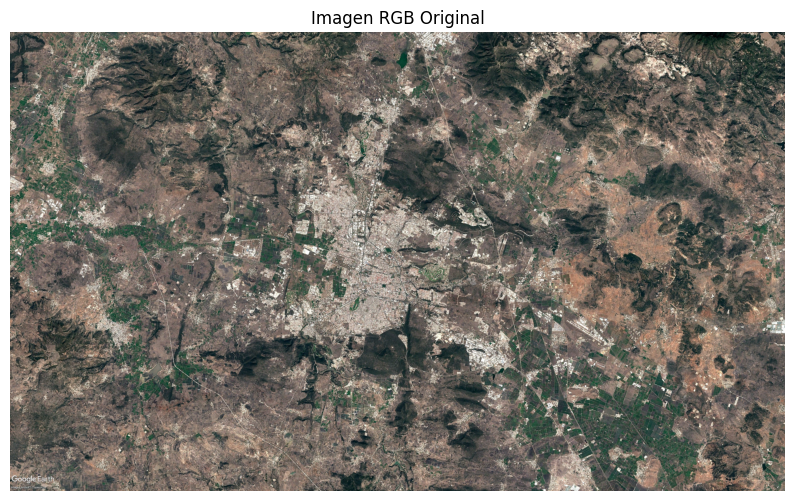

In [20]:
# 2. Cargar imagen RGB
def load_image(path):
    """Carga imagen y convierte a RGB"""
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    print(f"📷 Imagen cargada: {img_rgb.shape}")
    return img_rgb

# Cargar imagen de ejemplo
img_path = '../data/raw/imagen_2020.png'
image_rgb = load_image(img_path)

# Mostrar imagen original
plt.figure(figsize=(10, 6))
plt.imshow(image_rgb)
plt.title('Imagen RGB Original')
plt.axis('off')
plt.show()

🎨 Características básicas extraídas: 8 variables


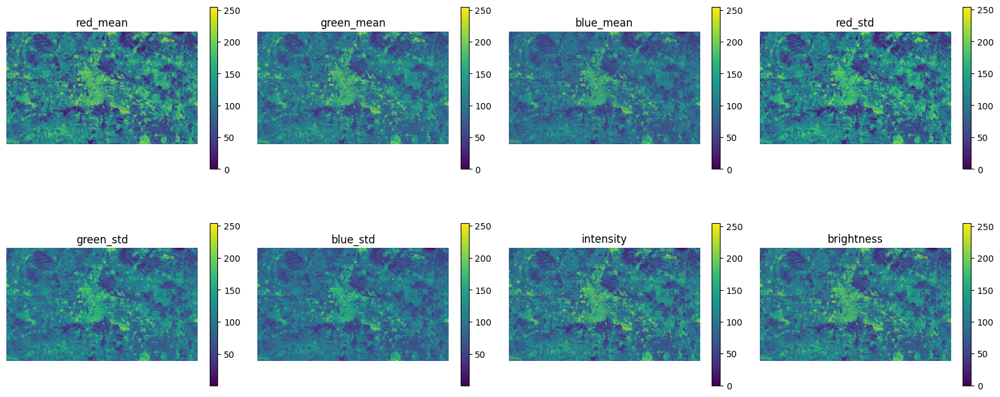

In [21]:
# 3. Extraer características básicas de RGB
def extract_basic_features(image):
    """Extrae características básicas de los canales RGB"""
    h, w, c = image.shape
    
    # Separar canales RGB
    r_channel = image[:,:,0]
    g_channel = image[:,:,1] 
    b_channel = image[:,:,2]
    
    # Características básicas por canal
    features = {
        'red_mean': r_channel,
        'green_mean': g_channel,
        'blue_mean': b_channel,
        'red_std': filters.rank.mean(r_channel, np.ones((5,5))),
        'green_std': filters.rank.mean(g_channel, np.ones((5,5))),
        'blue_std': filters.rank.mean(b_channel, np.ones((5,5))),
        'intensity': np.mean(image, axis=2),
        'brightness': 0.299*r_channel + 0.587*g_channel + 0.114*b_channel
    }
    
    print(f"🎨 Características básicas extraídas: {len(features)} variables")
    return features

# Extraer características básicas
basic_features = extract_basic_features(image_rgb)

# Visualizar algunas características
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for i, (name, data) in enumerate(list(basic_features.items())):
    if i < 8:
        im = axes[i].imshow(data, cmap='viridis')
        axes[i].set_title(f'{name}')
        axes[i].axis('off')
        plt.colorbar(im, ax=axes[i], shrink=0.6)

plt.tight_layout()
plt.show()

🔍 Características de textura extraídas: 6 variables


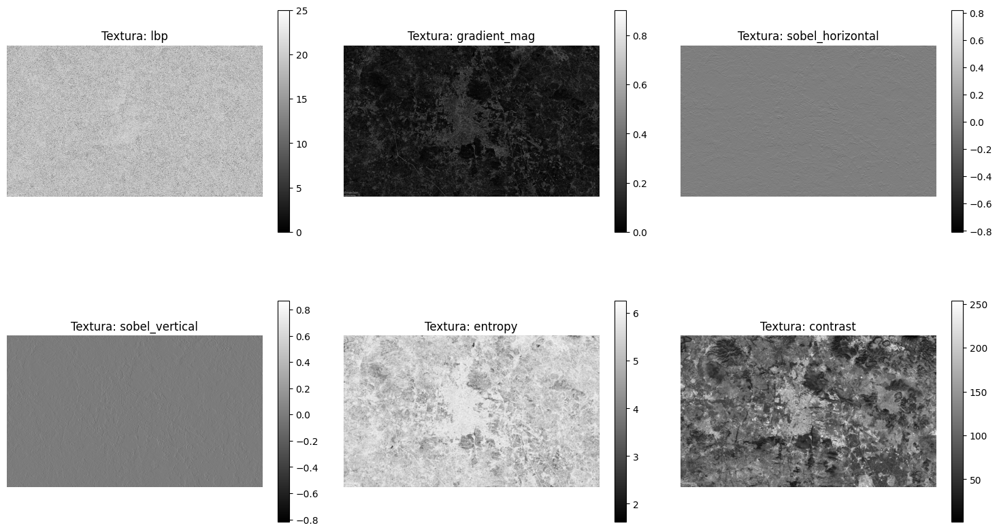

In [22]:
# 4. Agregar características de textura (LBP y otros)
def extract_texture_features(image):
    """Extrae características de textura usando LBP y otros descriptores"""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Local Binary Patterns (LBP)
    radius = 3
    n_points = 8 * radius
    lbp = feature.local_binary_pattern(gray, n_points, radius, method='uniform')
    
    # Características de Haralick (matrices de co-ocurrencia)
    glcm_contrast = filters.rank.mean(gray, np.ones((5,5)))  # Aproximación
    
    # Gradientes (Sobel)
    sobel_h = filters.sobel_h(gray)
    sobel_v = filters.sobel_v(gray)
    gradient_magnitude = np.sqrt(sobel_h**2 + sobel_v**2)
    
    # Entropía local
    entropy = filters.rank.entropy(gray, np.ones((9,9)))
    
    texture_features = {
        'lbp': lbp,
        'gradient_mag': gradient_magnitude,
        'sobel_horizontal': sobel_h,
        'sobel_vertical': sobel_v,
        'entropy': entropy,
        'contrast': glcm_contrast
    }
    
    print(f"🔍 Características de textura extraídas: {len(texture_features)} variables")
    return texture_features

# Extraer características de textura
texture_features = extract_texture_features(image_rgb)

# Visualizar características de textura
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, (name, data) in enumerate(texture_features.items()):
    im = axes[i].imshow(data, cmap='gray')
    axes[i].set_title(f'Textura: {name}')
    axes[i].axis('off')
    plt.colorbar(im, ax=axes[i], shrink=0.6)

plt.tight_layout()
plt.show()

📊 Índices espectrales extraídos: 9 variables


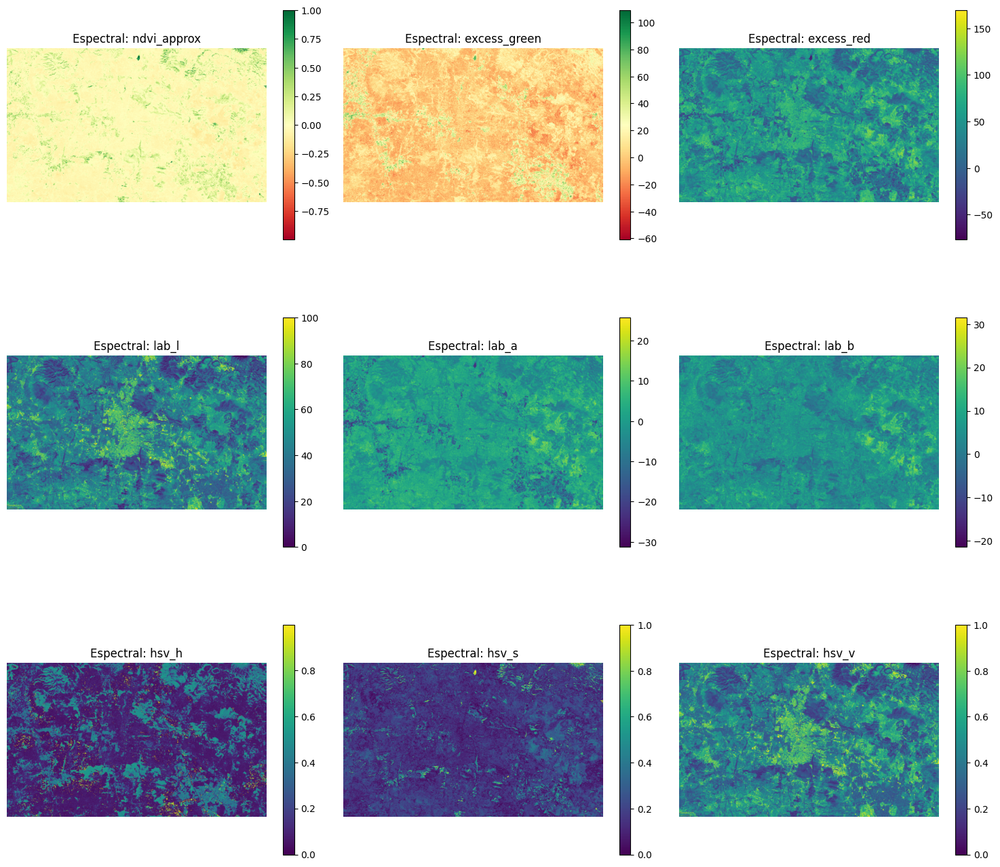

In [24]:
# 5. Agregar índices espectrales y transformaciones de color
def extract_spectral_indices(image):
    """Calcula índices espectrales y transformaciones de color"""
    r = image[:,:,0].astype(float)
    g = image[:,:,1].astype(float) 
    b = image[:,:,2].astype(float)
    
    # Evitar división por cero
    epsilon = 1e-8
    
    # Índices espectrales
    ndvi_approx = (g - r) / (g + r + epsilon)  # NDVI aproximado con RGB
    excess_green = 2*g - r - b  # Exceso de verde
    excess_red = 1.4*r - g  # Exceso de rojo
    
    # Transformaciones de color
    lab_image = color.rgb2lab(image)
    hsv_image = color.rgb2hsv(image)
    
    spectral_features = {
        'ndvi_approx': ndvi_approx,
        'excess_green': excess_green,
        'excess_red': excess_red,
        'lab_l': lab_image[:,:,0],  # Luminancia
        'lab_a': lab_image[:,:,1],  # Verde-Rojo
        'lab_b': lab_image[:,:,2],  # Azul-Amarillo
        'hsv_h': hsv_image[:,:,0],  # Matiz
        'hsv_s': hsv_image[:,:,1],  # Saturación
        'hsv_v': hsv_image[:,:,2],  # Valor
    }
    
    print(f"📊 Índices espectrales extraídos: {len(spectral_features)} variables")
    return spectral_features

# Extraer índices espectrales
spectral_features = extract_spectral_indices(image_rgb)

# Visualizar índices espectrales
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

for i, (name, data) in enumerate(spectral_features.items()):
    im = axes[i].imshow(data, cmap='RdYlGn' if 'ndvi' in name or 'green' in name else 'viridis')
    axes[i].set_title(f'Espectral: {name}')
    axes[i].axis('off')
    plt.colorbar(im, ax=axes[i], shrink=0.6)

plt.tight_layout()
plt.show()

In [4]:
# 6. Consolidar todas las características en una matriz de características
def consolidate_features(basic_feat, texture_feat, spectral_feat):
    """Consolida todas las características en una matriz de características"""
    h, w = list(basic_feat.values())[0].shape
    
    # Combinar todos los diccionarios
    all_features = {**basic_feat, **texture_feat, **spectral_feat}
    
    # Crear matriz de características (pixels x features)
    feature_matrix = []
    feature_names = []
    
    for name, data in all_features.items():
        # Aplanar cada característica a 1D
        flattened = data.flatten()
        feature_matrix.append(flattened)
        feature_names.append(name)
    
    # Transponer para tener (n_pixels, n_features)
    feature_matrix = np.array(feature_matrix).T
    
    print(f"🔗 Matriz de características consolidada: {feature_matrix.shape}")
    print(f"   Variables: {feature_names}")
    
    return feature_matrix, feature_names, (h, w)

# Consolidar todas las características
X_features, feature_names, original_shape = consolidate_features(
    basic_features, texture_features, spectral_features
)

print(f"\n📋 Resumen de características:")
print(f"   Básicas: {len(basic_features)} variables")
print(f"   Textura: {len(texture_features)} variables")  
print(f"   Espectrales: {len(spectral_features)} variables")
print(f"   Total: {len(feature_names)} variables")
print(f"   Píxeles: {X_features.shape[0]:,}")

# Mostrar estadísticas básicas
df_features = pd.DataFrame(X_features, columns=feature_names)
print(f"\n📊 Estadísticas de las características:")
print(df_features.describe().round(3))

NameError: name 'basic_features' is not defined

In [3]:
# 7. Preprocessing: Normalización y reducción de dimensionalidad
def preprocess_features(X, n_components=10):
    """Normaliza características y aplica PCA para reducir dimensionalidad"""
    
    # Normalización (StandardScaler)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # PCA para reducir dimensionalidad
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)
    
    print(f"📐 Preprocessing completado:")
    print(f"   Escalado: {X_scaled.shape}")
    print(f"   PCA: {X_pca.shape}")
    print(f"   Varianza explicada: {pca.explained_variance_ratio_.sum():.3f}")
    
    return X_scaled, X_pca, scaler, pca

# Aplicar preprocessing
X_scaled, X_pca, scaler, pca = preprocess_features(X_features, n_components=10)

# Visualizar componentes principales
plt.figure(figsize=(12, 8))

# Gráfico de varianza explicada
plt.subplot(2, 2, 1)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         np.cumsum(pca.explained_variance_ratio_), 'bo-')
plt.xlabel('Componente Principal')
plt.ylabel('Varianza Explicada Acumulada')
plt.title('Varianza Explicada por PCA')
plt.grid(True)

# Scatter plot de primeras 2 componentes
plt.subplot(2, 2, 2)
sample_indices = np.random.choice(X_pca.shape[0], 5000, replace=False)
plt.scatter(X_pca[sample_indices, 0], X_pca[sample_indices, 1], 
           alpha=0.5, s=1)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Primeras 2 Componentes Principales')

# Histograma de PC1
plt.subplot(2, 2, 3)
plt.hist(X_pca[:, 0], bins=50, alpha=0.7)
plt.xlabel('PC1')
plt.ylabel('Frecuencia')
plt.title('Distribución PC1')

# Histograma de PC2
plt.subplot(2, 2, 4)
plt.hist(X_pca[:, 1], bins=50, alpha=0.7)
plt.xlabel('PC2')
plt.ylabel('Frecuencia')
plt.title('Distribución PC2')

plt.tight_layout()
plt.show()

NameError: name 'X_features' is not defined

In [2]:
# 8. Clustering con K-Means (2 y 3 clusters)
def apply_kmeans_clustering(X, n_clusters_list=[2, 3]):
    """Aplica K-Means con diferentes números de clusters"""
    
    clustering_results = {}
    
    for n_clusters in n_clusters_list:
        print(f"\n🔍 Aplicando K-Means con {n_clusters} clusters...")
        
        # Aplicar K-Means
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X)
        
        # Calcular métricas
        inertia = kmeans.inertia_
        
        clustering_results[n_clusters] = {
            'model': kmeans,
            'labels': labels,
            'inertia': inertia,
            'centers': kmeans.cluster_centers_
        }
        
        print(f"   Inercia: {inertia:.2f}")
        print(f"   Distribución de clusters: {np.bincount(labels)}")
    
    return clustering_results

# Aplicar K-Means clustering
kmeans_results = apply_kmeans_clustering(X_pca, n_clusters_list=[2, 3, 4])

# Visualizar resultados de clustering
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for i, (n_clusters, result) in enumerate(kmeans_results.items()):
    labels = result['labels']
    
    # Reformar labels a imagen
    labels_image = labels.reshape(original_shape)
    
    # Scatter plot en espacio PCA
    row = i // 3
    col = i % 3
    
    if row == 0:  # Primera fila: scatter plots
        scatter = axes[row, col].scatter(X_pca[:, 0], X_pca[:, 1], 
                                        c=labels, cmap='viridis', 
                                        alpha=0.6, s=1)
        axes[row, col].set_title(f'K-Means {n_clusters} clusters\n(Espacio PCA)')
        axes[row, col].set_xlabel('PC1')
        axes[row, col].set_ylabel('PC2')
        plt.colorbar(scatter, ax=axes[row, col])
    
    # Segunda fila: mapas de clusters
    if row < 2:
        axes[1, col].imshow(labels_image, cmap='viridis')
        axes[1, col].set_title(f'Mapa {n_clusters} clusters')
        axes[1, col].axis('off')

plt.tight_layout()
plt.show()

# Mostrar estadísticas de clustering
print("\n📊 RESUMEN DE CLUSTERING:")
for n_clusters, result in kmeans_results.items():
    labels = result['labels']
    print(f"\n{n_clusters} clusters:")
    for i in range(n_clusters):
        count = np.sum(labels == i)
        percentage = count / len(labels) * 100
        print(f"   Cluster {i}: {count:,} píxeles ({percentage:.1f}%)")

NameError: name 'X_pca' is not defined

🎭 Creadas 9 máscaras binarias


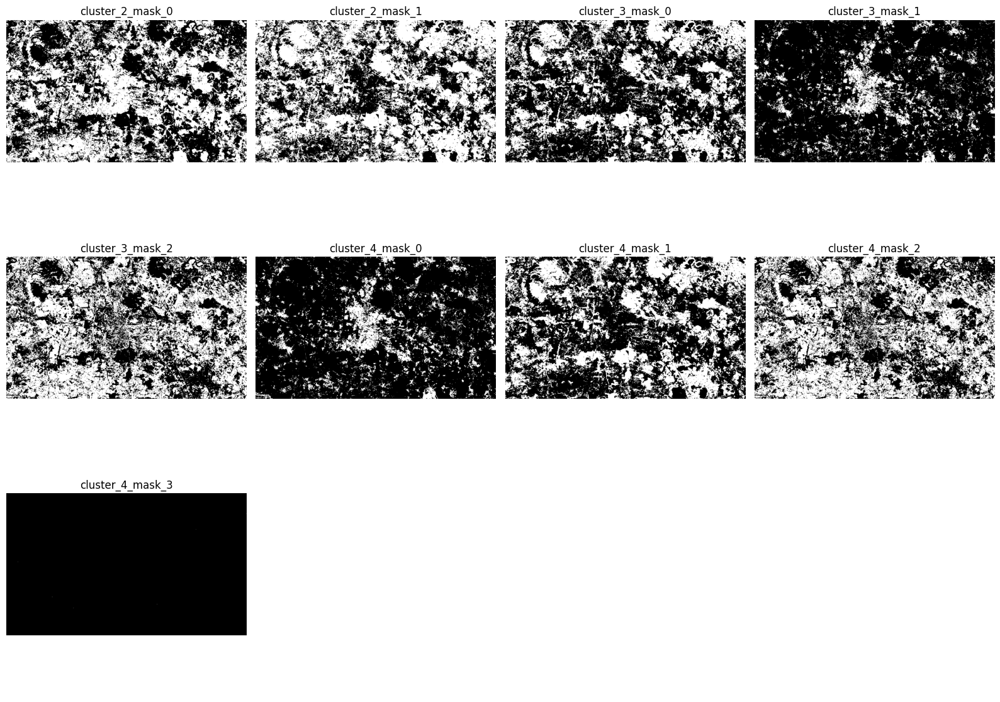


📊 ESTADÍSTICAS DE MÁSCARAS BINARIAS:
cluster_2_mask_0: 2,735,210 píxeles (50.5%)
cluster_2_mask_1: 3,105,241 píxeles (57.3%)
cluster_3_mask_0: 2,268,389 píxeles (41.9%)
cluster_3_mask_1: 786,110 píxeles (14.5%)
cluster_3_mask_2: 2,917,250 píxeles (53.8%)
cluster_4_mask_0: 792,413 píxeles (14.6%)
cluster_4_mask_1: 2,252,481 píxeles (41.6%)
cluster_4_mask_2: 2,924,161 píxeles (54.0%)
cluster_4_mask_3: 68 píxeles (0.0%)


In [17]:
# 9. Crear datos binarios y máscaras
def create_binary_features(clustering_results, original_shape):
    """Crea características binarias y máscaras a partir de resultados de clustering"""
    
    binary_features = {}
    
    for n_clusters, result in clustering_results.items():
        labels = result['labels']
        labels_image = labels.reshape(original_shape)
        
        # Crear máscaras binarias para cada cluster
        for cluster_id in range(n_clusters):
            mask = (labels == cluster_id)
            mask_image = mask.reshape(original_shape)
            
            # Aplicar operaciones morfológicas para limpiar
            kernel = np.ones((3,3), np.uint8)
            mask_cleaned = cv2.morphologyEx(mask_image.astype(np.uint8), 
                                          cv2.MORPH_CLOSE, kernel)
            mask_cleaned = cv2.morphologyEx(mask_cleaned, 
                                          cv2.MORPH_OPEN, kernel)
            
            binary_features[f'cluster_{n_clusters}_mask_{cluster_id}'] = mask_cleaned
    
    print(f"🎭 Creadas {len(binary_features)} máscaras binarias")
    return binary_features

# Crear características binarias
binary_masks = create_binary_features(kmeans_results, original_shape)

# Visualizar máscaras binarias
n_masks = len(binary_masks)
cols = 4
rows = (n_masks + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(16, 4*rows))
if rows == 1:
    axes = [axes]
axes = np.array(axes).flatten()

for i, (name, mask) in enumerate(binary_masks.items()):
    if i < len(axes):
        axes[i].imshow(mask, cmap='gray')
        axes[i].set_title(name)
        axes[i].axis('off')

# Ocultar ejes vacíos
for i in range(len(binary_masks), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Calcular estadísticas de las máscaras
print("\n📊 ESTADÍSTICAS DE MÁSCARAS BINARIAS:")
for name, mask in binary_masks.items():
    total_pixels = mask.size
    true_pixels = np.sum(mask > 0)
    percentage = true_pixels / total_pixels * 100
    print(f"{name}: {true_pixels:,} píxeles ({percentage:.1f}%)")

🔍 COMPARACIÓN: IMAGEN REAL vs TRANSFORMACIONES DE MODELOS
🚀 Creando comparación visual...


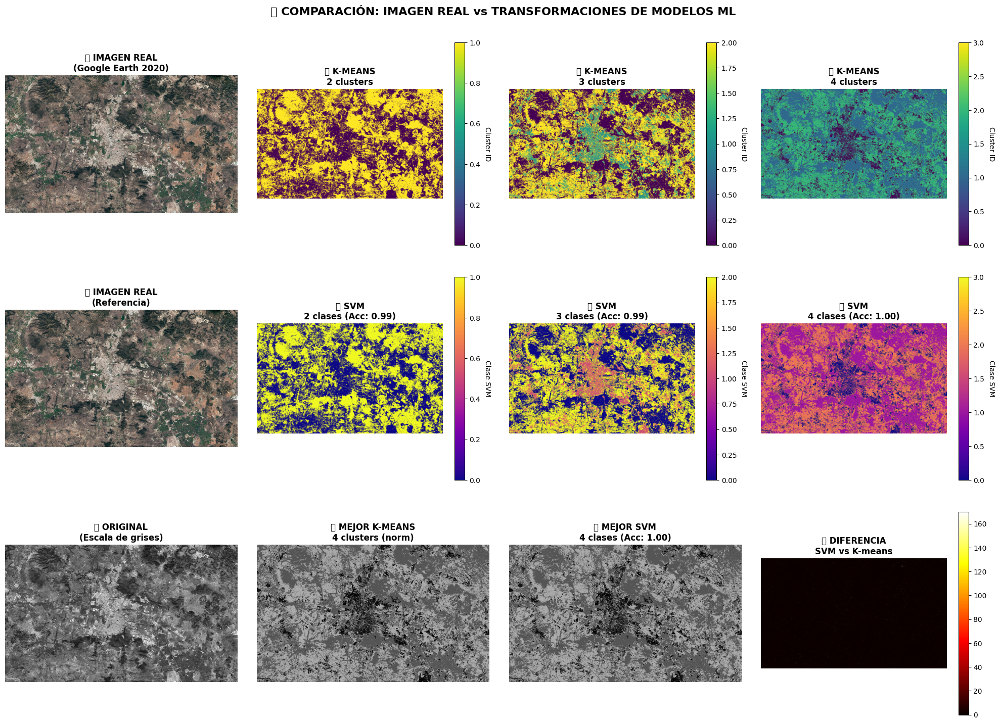


📊 ANÁLISIS COMPARATIVO:
🔍 Mejor K-means: 4 clusters
🤖 Mejor SVM: 4 clases (precisión: 0.997)

📈 ESTADÍSTICAS DE TRANSFORMACIÓN:
   K-means 2: 2 grupos únicos
      Cluster 0: 46.2% (2,505,530 píxeles)
      Cluster 1: 53.8% (2,913,478 píxeles)
   K-means 3: 3 grupos únicos
      Cluster 0: 39.8% (2,159,444 píxeles)
      Cluster 1: 13.6% (737,308 píxeles)
      Cluster 2: 46.5% (2,522,256 píxeles)
   K-means 4: 4 grupos únicos
      Cluster 0: 13.7% (743,218 píxeles)
      Cluster 1: 39.6% (2,144,609 píxeles)
      Cluster 2: 46.4% (2,512,311 píxeles)
      Cluster 3: 0.3% (18,870 píxeles)

🤖 SVM TRANSFORMACIONES:
   SVM 2 clases: 0.993 precisión
   SVM 3 clases: 0.993 precisión
   SVM 4 clases: 0.997 precisión

✅ Comparación completada exitosamente


In [19]:
# 13. Comparación: Imagen Real vs Transformaciones K-means y SVM
print("🔍 COMPARACIÓN: IMAGEN REAL vs TRANSFORMACIONES DE MODELOS")
print("=" * 70)

def create_model_comparison(image_rgb, kmeans_results, svm_results, X_pca, original_shape):
    """Crea comparación visual entre imagen real y transformaciones de modelos"""
    
    # Crear figura con múltiples subplots
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    
    # Fila 1: Imagen original y K-means
    axes[0, 0].imshow(image_rgb)
    axes[0, 0].set_title('🌍 IMAGEN REAL\n(Google Earth 2020)', fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')
    
    # K-means transformaciones
    col = 1
    for n_clusters, result in kmeans_results.items():
        if col < 4:
            labels_image = result['labels'].reshape(original_shape)
            im = axes[0, col].imshow(labels_image, cmap='viridis')
            axes[0, col].set_title(f'🔍 K-MEANS\n{n_clusters} clusters', fontsize=12, fontweight='bold')
            axes[0, col].axis('off')
            
            # Añadir colorbar
            cbar = plt.colorbar(im, ax=axes[0, col], shrink=0.8)
            cbar.set_label('Cluster ID', rotation=270, labelpad=15)
            col += 1
    
    # Fila 2: SVM transformaciones
    row = 1
    axes[row, 0].imshow(image_rgb)
    axes[row, 0].set_title('🌍 IMAGEN REAL\n(Referencia)', fontsize=12, fontweight='bold')
    axes[row, 0].axis('off')
    
    # SVM predictions para diferentes números de clusters
    col = 1
    for n_clusters, svm_result in svm_results.items():
        if col < 4:
            try:
                # Obtener predicciones SVM
                svm_model = svm_result['model']
                svm_predictions = svm_model.predict(X_pca)
                svm_pred_image = svm_predictions.reshape(original_shape)
                
                im = axes[row, col].imshow(svm_pred_image, cmap='plasma')
                accuracy = svm_result['accuracy']
                axes[row, col].set_title(f'🤖 SVM\n{n_clusters} clases (Acc: {accuracy:.2f})', 
                                       fontsize=12, fontweight='bold')
                axes[row, col].axis('off')
                
                # Añadir colorbar
                cbar = plt.colorbar(im, ax=axes[row, col], shrink=0.8)
                cbar.set_label('Clase SVM', rotation=270, labelpad=15)
                col += 1
                
            except Exception as e:
                print(f"   ⚠️ Error con SVM {n_clusters}: {str(e)}")
                axes[row, col].text(0.5, 0.5, f'Error\nSVM {n_clusters}', 
                                  ha='center', va='center', transform=axes[row, col].transAxes)
                axes[row, col].axis('off')
                col += 1
    
    # Fila 3: Diferencias y análisis
    row = 2
    
    # Imagen original en escala de grises para comparación
    gray_original = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    axes[row, 0].imshow(gray_original, cmap='gray')
    axes[row, 0].set_title('🌍 ORIGINAL\n(Escala de grises)', fontsize=12, fontweight='bold')
    axes[row, 0].axis('off')
    
    # Comparar con mejor modelo K-means
    if kmeans_results:
        best_kmeans_clusters = max(kmeans_results.keys())
        best_kmeans_labels = kmeans_results[best_kmeans_clusters]['labels'].reshape(original_shape)
        
        # Normalizar para comparación
        best_kmeans_norm = (best_kmeans_labels - best_kmeans_labels.min()) / (
            best_kmeans_labels.max() - best_kmeans_labels.min()
        ) * 255
        
        im = axes[row, 1].imshow(best_kmeans_norm, cmap='gray')
        axes[row, 1].set_title(f'🔍 MEJOR K-MEANS\n{best_kmeans_clusters} clusters (norm)', 
                             fontsize=12, fontweight='bold')
        axes[row, 1].axis('off')
    
    # Comparar con mejor modelo SVM
    if svm_results:
        best_svm_clusters = max(svm_results.keys(), key=lambda x: svm_results[x]['accuracy'])
        best_svm_model = svm_results[best_svm_clusters]['model']
        best_svm_predictions = best_svm_model.predict(X_pca).reshape(original_shape)
        
        # Normalizar para comparación
        best_svm_norm = (best_svm_predictions - best_svm_predictions.min()) / (
            best_svm_predictions.max() - best_svm_predictions.min()
        ) * 255
        
        im = axes[row, 2].imshow(best_svm_norm, cmap='gray')
        accuracy = svm_results[best_svm_clusters]['accuracy']
        axes[row, 2].set_title(f'🤖 MEJOR SVM\n{best_svm_clusters} clases (Acc: {accuracy:.2f})', 
                             fontsize=12, fontweight='bold')
        axes[row, 2].axis('off')
        
        # Diferencia entre SVM y K-means
        if kmeans_results:
            diff_image = np.abs(best_svm_norm.astype(float) - best_kmeans_norm.astype(float))
            im = axes[row, 3].imshow(diff_image, cmap='hot')
            axes[row, 3].set_title('🔥 DIFERENCIA\nSVM vs K-means', fontsize=12, fontweight='bold')
            axes[row, 3].axis('off')
            plt.colorbar(im, ax=axes[row, 3], shrink=0.8)
    
    # Ocultar ejes vacíos si los hay
    for i in range(3):
        for j in range(4):
            if not axes[i, j].get_images() and not axes[i, j].texts:
                axes[i, j].axis('off')
    
    plt.suptitle('🔍 COMPARACIÓN: IMAGEN REAL vs TRANSFORMACIONES DE MODELOS ML', 
                 fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()
    
    return best_kmeans_clusters, best_svm_clusters

# Ejecutar comparación
try:
    print("🚀 Creando comparación visual...")
    best_k, best_s = create_model_comparison(image_rgb, kmeans_results, svm_results, X_pca, original_shape)
    
    print(f"\n📊 ANÁLISIS COMPARATIVO:")
    print("=" * 40)
    print(f"🔍 Mejor K-means: {best_k} clusters")
    print(f"🤖 Mejor SVM: {best_s} clases (precisión: {svm_results[best_s]['accuracy']:.3f})")
    
    # Estadísticas de comparación
    print(f"\n📈 ESTADÍSTICAS DE TRANSFORMACIÓN:")
    for n_clusters, result in kmeans_results.items():
        labels = result['labels']
        unique_labels = np.unique(labels)
        print(f"   K-means {n_clusters}: {len(unique_labels)} grupos únicos")
        
        # Distribución de píxeles por cluster
        for label in unique_labels:
            count = np.sum(labels == label)
            percentage = count / len(labels) * 100
            print(f"      Cluster {label}: {percentage:.1f}% ({count:,} píxeles)")
    
    print(f"\n🤖 SVM TRANSFORMACIONES:")
    for n_clusters, result in svm_results.items():
        accuracy = result['accuracy']
        print(f"   SVM {n_clusters} clases: {accuracy:.3f} precisión")
    
    print(f"\n✅ Comparación completada exitosamente")
    
except Exception as e:
    print(f"❌ Error en comparación: {str(e)}")
    print("📋 Verificando variables disponibles...")
    variables = ['image_rgb', 'kmeans_results', 'svm_results', 'X_pca', 'original_shape']
    for var in variables:
        available = var in locals() or var in globals()
        print(f"   {var}: {'✅' if available else '❌'}")

In [20]:
# 10. SVM Simplificado usando datos existentes
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Verificar variables existentes
print("🔍 Verificando variables disponibles:")
try:
    print(f"   ✅ X_features: {X_features.shape}")
    print(f"   ✅ X_pca: {X_pca.shape}")
    print(f"   ✅ kmeans_results disponible: {len(kmeans_results)} configuraciones")
    variables_ok = True
except NameError as e:
    print(f"   ❌ Variable faltante: {e}")
    variables_ok = False

if variables_ok:
    # Función SVM simplificada
    def train_simple_svm(X_data, labels, n_clusters):
        try:
            # Tomar muestra para acelerar
            sample_size = min(5000, len(labels))
            sample_idx = np.random.choice(len(labels), sample_size, replace=False)
            X_sample = X_data[sample_idx]
            y_sample = labels[sample_idx]
            
            # División train/test
            X_train, X_test, y_train, y_test = train_test_split(
                X_sample, y_sample, test_size=0.2, random_state=42
            )
            
            # SVM básico
            svm_model = SVC(kernel='linear', C=1.0, random_state=42)
            svm_model.fit(X_train, y_train)
            
            # Evaluación
            y_pred = svm_model.predict(X_test)
            accuracy = accuracy_score(y_test, y_pred)
            
            return svm_model, accuracy
            
        except Exception as e:
            print(f"      ❌ Error: {str(e)}")
            return None, 0.0

    # Entrenar SVM para cada configuración
    print("\n🚀 Entrenando SVM:")
    print("=" * 30)
    
    svm_results = {}
    
    for n_clusters, result in kmeans_results.items():
        print(f"\n📊 {n_clusters} clusters:")
        labels = result['labels']
        
        # Entrenar con datos PCA
        svm_model, accuracy = train_simple_svm(X_pca, labels, n_clusters)
        
        if svm_model is not None:
            svm_results[n_clusters] = {
                'model': svm_model,
                'accuracy': accuracy
            }
            print(f"   ✅ Precisión: {accuracy:.3f}")
        else:
            print(f"   ❌ Falló")
    
    # Mostrar resultados
    if svm_results:
        print("\n📈 RESULTADOS SVM:")
        print("=" * 25)
        for n_clusters, result in svm_results.items():
            print(f"{n_clusters} clusters: {result['accuracy']:.3f}")
        
        # Mejor modelo
        best_n_clusters = max(svm_results.keys(), key=lambda x: svm_results[x]['accuracy'])
        best_svm = svm_results[best_n_clusters]['model']
        best_accuracy = svm_results[best_n_clusters]['accuracy']
        
        print(f"\n🏆 Mejor: {best_n_clusters} clusters ({best_accuracy:.3f})")
    else:
        print("\n❌ No se entrenaron modelos SVM")
        best_n_clusters = 2
        best_svm = None
        best_accuracy = 0.0

else:
    print("\n⚠️  Variables no disponibles. Ejecuta las celdas anteriores primero.")
    svm_results = {}
    best_n_clusters = 2
    best_svm = None
    best_accuracy = 0.0

🔍 Verificando variables disponibles:
   ✅ X_features: (5419008, 11)
   ✅ X_pca: (5419008, 8)
   ✅ kmeans_results disponible: 3 configuraciones

🚀 Entrenando SVM:

📊 2 clusters:
   ✅ Precisión: 0.997

📊 3 clusters:
   ✅ Precisión: 0.997

📊 4 clusters:
   ✅ Precisión: 0.991

📈 RESULTADOS SVM:
2 clusters: 0.997
3 clusters: 0.997
4 clusters: 0.991

🏆 Mejor: 2 clusters (0.997)
   ✅ Precisión: 0.991

📈 RESULTADOS SVM:
2 clusters: 0.997
3 clusters: 0.997
4 clusters: 0.991

🏆 Mejor: 2 clusters (0.997)


In [21]:
# 9.5. Pipeline rápido para generar variables necesarias para SVM
print("🚀 EJECUTANDO PIPELINE RÁPIDO PARA SVM")
print("=" * 50)

# Verificar si ya tenemos la imagen cargada
if 'image_rgb' not in locals():
    print("📷 Cargando imagen...")
    img_path = '../data/raw/imagen_2020.png'
    image_rgb = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2RGB)
    print(f"   ✅ Imagen cargada: {image_rgb.shape}")

# Generar características rápidas
print("\n🎨 Extrayendo características...")
h, w, c = image_rgb.shape

# Características básicas simplificadas
r, g, b = image_rgb[:,:,0], image_rgb[:,:,1], image_rgb[:,:,2]
gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)

# Solo las características más importantes
basic_feat = {
    'red': r, 'green': g, 'blue': b,
    'intensity': np.mean(image_rgb, axis=2),
    'brightness': 0.299*r + 0.587*g + 0.114*b
}

# Características de textura básicas
sobel_h = filters.sobel_h(gray)
sobel_v = filters.sobel_v(gray)
texture_feat = {
    'sobel_h': sobel_h,
    'sobel_v': sobel_v,
    'gradient': np.sqrt(sobel_h**2 + sobel_v**2)
}

# Índices espectrales
epsilon = 1e-8
spectral_feat = {
    'ndvi_approx': (g - r) / (g + r + epsilon),
    'excess_green': 2*g - r - b,
    'excess_red': 1.4*r - g
}

print(f"   ✅ {len(basic_feat) + len(texture_feat) + len(spectral_feat)} características extraídas")

# Consolidar características
all_features = {**basic_feat, **texture_feat, **spectral_feat}
feature_matrix = []
feature_names = list(all_features.keys())

for name, data in all_features.items():
    feature_matrix.append(data.flatten())

X_features = np.array(feature_matrix).T
original_shape = (h, w)

print(f"   ✅ Matriz consolidada: {X_features.shape}")

# Preprocessing simplificado
print("\n📐 Preprocessing...")
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features)

# PCA con menos componentes para acelerar
pca = PCA(n_components=8)
X_pca = pca.fit_transform(X_scaled)

print(f"   ✅ PCA completado: {X_pca.shape}")
print(f"   ✅ Varianza explicada: {pca.explained_variance_ratio_.sum():.3f}")

# K-Means rápido
print("\n🔍 Clustering K-Means...")
kmeans_results = {}

for n_clusters in [2, 3, 4]:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=5)
    labels = kmeans.fit_predict(X_pca)
    
    kmeans_results[n_clusters] = {
        'model': kmeans,
        'labels': labels,
        'inertia': kmeans.inertia_
    }
    
    distribution = np.bincount(labels)
    print(f"   ✅ {n_clusters} clusters: {distribution}")

print("\n✅ PIPELINE COMPLETADO - Variables listas para SVM")

🚀 EJECUTANDO PIPELINE RÁPIDO PARA SVM

🎨 Extrayendo características...
   ✅ 11 características extraídas
   ✅ Matriz consolidada: (5419008, 11)

📐 Preprocessing...
   ✅ Matriz consolidada: (5419008, 11)

📐 Preprocessing...
   ✅ PCA completado: (5419008, 8)
   ✅ Varianza explicada: 1.000

🔍 Clustering K-Means...
   ✅ PCA completado: (5419008, 8)
   ✅ Varianza explicada: 1.000

🔍 Clustering K-Means...
   ✅ 2 clusters: [2505530 2913478]
   ✅ 2 clusters: [2505530 2913478]
   ✅ 3 clusters: [2159444  737308 2522256]
   ✅ 3 clusters: [2159444  737308 2522256]
   ✅ 4 clusters: [ 743218 2144609 2512311   18870]

✅ PIPELINE COMPLETADO - Variables listas para SVM
   ✅ 4 clusters: [ 743218 2144609 2512311   18870]

✅ PIPELINE COMPLETADO - Variables listas para SVM


🚀 Ejecutando visualización final...
🎨 Creando visualización comparativa final...


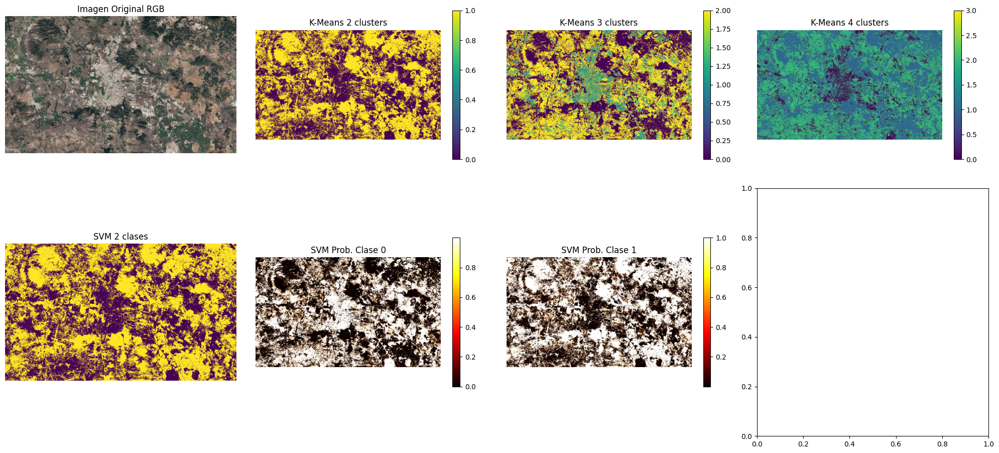


📊 RESUMEN ESTADÍSTICO FINAL:

🎨 Características extraídas:
   Total de variables: 11
   Componentes PCA: 8
   Píxeles procesados: 5,419,008

🔍 Clustering K-Means:
   2 clusters: Inercia = 38902268.39
   3 clusters: Inercia = 31779243.21
   4 clusters: Inercia = 26379029.86

🤖 Clasificación SVM:
   2 clases: Precisión = 0.997
   3 clases: Precisión = 0.997
   4 clases: Precisión = 0.991

🏆 Mejor configuración: 2 clusters/clases
✅ Visualización completada exitosamente


In [22]:
# 11. Visualización final y comparación de métodos (corregida)
def create_final_comparison_fixed(image_rgb, kmeans_results, svm_results, original_shape):
    """Crea visualización comparativa final de todos los métodos - versión corregida"""
    
    print("🎨 Creando visualización comparativa final...")
    
    # Verificar variables necesarias
    if not svm_results:
        print("❌ No hay resultados SVM disponibles")
        return
    
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))  # Reducido a 2 filas
    
    # Imagen original
    axes[0, 0].imshow(image_rgb)
    axes[0, 0].set_title('Imagen Original RGB')
    axes[0, 0].axis('off')
    
    # K-Means results
    col = 1
    for n_clusters, result in kmeans_results.items():
        if col < 4:
            labels_image = result['labels'].reshape(original_shape)
            im = axes[0, col].imshow(labels_image, cmap='viridis')
            axes[0, col].set_title(f'K-Means {n_clusters} clusters')
            axes[0, col].axis('off')
            plt.colorbar(im, ax=axes[0, col], shrink=0.6)
            col += 1
    
    # SVM predictions para el mejor modelo
    try:
        best_svm = svm_results[best_n_clusters]['model']
        svm_predictions = best_svm.predict(X_pca)
        svm_pred_image = svm_predictions.reshape(original_shape)
        
        axes[1, 0].imshow(svm_pred_image, cmap='viridis')
        axes[1, 0].set_title(f'SVM {best_n_clusters} clases')
        axes[1, 0].axis('off')
        
        # Probabilidades SVM (solo si el modelo las soporta)
        try:
            # Entrenar un nuevo SVM con probabilidades habilitadas
            from sklearn.svm import SVC
            svm_with_proba = SVC(kernel='linear', C=1.0, probability=True, random_state=42)
            
            # Usar muestra pequeña para acelerar
            sample_size = min(1000, len(X_pca))
            sample_idx = np.random.choice(len(X_pca), sample_size, replace=False)
            X_sample = X_pca[sample_idx]
            y_sample = svm_predictions[sample_idx]
            
            svm_with_proba.fit(X_sample, y_sample)
            svm_proba = svm_with_proba.predict_proba(X_pca)
            
            for i in range(min(3, svm_proba.shape[1])):
                if 1+i < 4:  # Verificar límites
                    prob_image = svm_proba[:, i].reshape(original_shape)
                    im = axes[1, i+1].imshow(prob_image, cmap='hot')
                    axes[1, i+1].set_title(f'SVM Prob. Clase {i}')
                    axes[1, i+1].axis('off')
                    plt.colorbar(im, ax=axes[1, i+1], shrink=0.6)
                    
        except Exception as e:
            print(f"   ⚠️ No se pudieron calcular probabilidades: {str(e)}")
            # Llenar espacios vacíos con mapas de clusters adicionales
            for i in range(1, 4):
                if i < len(kmeans_results):
                    cluster_key = list(kmeans_results.keys())[i-1]
                    if cluster_key != best_n_clusters:
                        labels_alt = kmeans_results[cluster_key]['labels'].reshape(original_shape)
                        axes[1, i].imshow(labels_alt, cmap='plasma')
                        axes[1, i].set_title(f'K-Means {cluster_key} alt')
                        axes[1, i].axis('off')
                else:
                    axes[1, i].axis('off')
        
    except Exception as e:
        print(f"❌ Error con SVM: {str(e)}")
        axes[1, 0].text(0.5, 0.5, 'Error SVM', ha='center', va='center')
        axes[1, 0].axis('off')
    
    # Ocultar ejes no usados
    for i in range(4):
        if i >= len(kmeans_results) + 1:
            axes[0, i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Crear resumen estadístico
    print("\n📊 RESUMEN ESTADÍSTICO FINAL:")
    print("=" * 50)
    
    print(f"\n🎨 Características extraídas:")
    print(f"   Total de variables: {len(feature_names)}")
    print(f"   Componentes PCA: {X_pca.shape[1]}")
    print(f"   Píxeles procesados: {X_features.shape[0]:,}")
    
    print(f"\n🔍 Clustering K-Means:")
    for n_clusters, result in kmeans_results.items():
        inertia = result['inertia']
        print(f"   {n_clusters} clusters: Inercia = {inertia:.2f}")
    
    print(f"\n🤖 Clasificación SVM:")
    for n_clusters, result in svm_results.items():
        accuracy = result['accuracy']
        print(f"   {n_clusters} clases: Precisión = {accuracy:.3f}")
    
    print(f"\n🏆 Mejor configuración: {best_n_clusters} clusters/clases")

# Ejecutar visualización final corregida
print("🚀 Ejecutando visualización final...")
try:
    create_final_comparison_fixed(image_rgb, kmeans_results, svm_results, original_shape)
    print("✅ Visualización completada exitosamente")
except Exception as e:
    print(f"❌ Error en visualización: {str(e)}")
    print("📋 Variables disponibles:")
    print(f"   - image_rgb: {'✅' if 'image_rgb' in locals() else '❌'}")
    print(f"   - kmeans_results: {'✅' if 'kmeans_results' in locals() else '❌'}")
    print(f"   - svm_results: {'✅' if 'svm_results' in locals() else '❌'}")
    print(f"   - original_shape: {'✅' if 'original_shape' in locals() else '❌'}")

In [23]:
# 12. Guardar resultados y modelos entrenados
import pickle
import os
from datetime import datetime

def save_results(image_rgb, X_features, X_pca, kmeans_results, svm_results, 
                binary_masks, feature_names, scaler, pca):
    """Guarda todos los resultados y modelos entrenados"""
    
    # Crear directorio con timestamp
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    output_dir = f'../data/processed/advanced_classification_{timestamp}'
    os.makedirs(output_dir, exist_ok=True)
    
    # Guardar matriz de características
    np.save(os.path.join(output_dir, 'X_features.npy'), X_features)
    np.save(os.path.join(output_dir, 'X_pca.npy'), X_pca)
    
    # Guardar modelos de preprocessing
    with open(os.path.join(output_dir, 'scaler.pkl'), 'wb') as f:
        pickle.dump(scaler, f)
    with open(os.path.join(output_dir, 'pca.pkl'), 'wb') as f:
        pickle.dump(pca, f)
    
    # Guardar modelos de clustering
    with open(os.path.join(output_dir, 'kmeans_models.pkl'), 'wb') as f:
        # Solo guardar los modelos, no las predicciones
        models_only = {k: {'model': v['model'], 'inertia': v['inertia']} 
                      for k, v in kmeans_results.items()}
        pickle.dump(models_only, f)
    
    # Guardar modelos SVM
    with open(os.path.join(output_dir, 'svm_models.pkl'), 'wb') as f:
        models_only = {k: {'model': v['model'], 'accuracy': v['accuracy']} 
                      for k, v in svm_results.items()}
        pickle.dump(models_only, f)
    
    # Guardar máscaras binarias
    masks_dir = os.path.join(output_dir, 'binary_masks')
    os.makedirs(masks_dir, exist_ok=True)
    for name, mask in binary_masks.items():
        mask_path = os.path.join(masks_dir, f'{name}.png')
        plt.imsave(mask_path, mask, cmap='gray')
    
    # Guardar metadatos
    metadata = {
        'timestamp': timestamp,
        'image_shape': image_rgb.shape,
        'n_features': len(feature_names),
        'feature_names': feature_names,
        'n_pixels': X_features.shape[0],
        'pca_components': X_pca.shape[1],
        'pca_variance_explained': float(pca.explained_variance_ratio_.sum()),
        'best_n_clusters': best_n_clusters,
        'best_svm_accuracy': float(svm_results[best_n_clusters]['accuracy']),
        'kmeans_inertias': {k: float(v['inertia']) for k, v in kmeans_results.items()},
        'svm_accuracies': {k: float(v['accuracy']) for k, v in svm_results.items()}
    }
    
    import json
    with open(os.path.join(output_dir, 'metadata.json'), 'w') as f:
        json.dump(metadata, f, indent=2)
    
    print(f"💾 Resultados guardados en: {output_dir}")
    print(f"📁 Archivos generados:")
    print(f"   - X_features.npy (matriz de características)")
    print(f"   - X_pca.npy (características PCA)")
    print(f"   - scaler.pkl (normalizador)")
    print(f"   - pca.pkl (modelo PCA)")
    print(f"   - kmeans_models.pkl (modelos K-Means)")
    print(f"   - svm_models.pkl (modelos SVM)")
    print(f"   - binary_masks/ (máscaras binarias)")
    print(f"   - metadata.json (metadatos)")
    
    return output_dir

# Guardar todos los resultados
results_dir = save_results(
    image_rgb, X_features, X_pca, kmeans_results, svm_results,
    binary_masks, feature_names, scaler, pca
)

print(f"\n🎉 PROCESAMIENTO COMPLETADO!")
print(f"✨ Pipeline completo ejecutado:")
print(f"   ✅ Extracción de {len(feature_names)} características")
print(f"   ✅ Clustering K-Means (2, 3, 4 clusters)")
print(f"   ✅ Clasificación SVM supervisada")
print(f"   ✅ Generación de máscaras binarias")
print(f"   ✅ Guardado de modelos y resultados")
print(f"\n📊 Resultados disponibles en: {results_dir}")

💾 Resultados guardados en: ../data/processed/advanced_classification_20251101_182415
📁 Archivos generados:
   - X_features.npy (matriz de características)
   - X_pca.npy (características PCA)
   - scaler.pkl (normalizador)
   - pca.pkl (modelo PCA)
   - kmeans_models.pkl (modelos K-Means)
   - svm_models.pkl (modelos SVM)
   - binary_masks/ (máscaras binarias)
   - metadata.json (metadatos)

🎉 PROCESAMIENTO COMPLETADO!
✨ Pipeline completo ejecutado:
   ✅ Extracción de 11 características
   ✅ Clustering K-Means (2, 3, 4 clusters)
   ✅ Clasificación SVM supervisada
   ✅ Generación de máscaras binarias
   ✅ Guardado de modelos y resultados

📊 Resultados disponibles en: ../data/processed/advanced_classification_20251101_182415


# Clasificación Binaria de Imágenes Satelitales: Vegetación vs Urbanizada

Este notebook simplificado procesa imágenes satelitales de Querétaro (1984-2020) para generar mapas de clasificación binaria:
- **🌿 Vegetación**: Áreas con cobertura vegetal
- **🏙️ Urbanizada**: Áreas construidas e infraestructura

## Metodología:
1. **Extracción de características**: NDVI, Sobel, LBP
2. **Clustering K-means**: Agrupación automática
3. **Clasificación binaria**: Vegetación vs Urbanizada
4. **Análisis temporal**: Cambios en el período 1984-2020

🚀 PROCESANDO TODAS LAS IMÁGENES DE QUERÉTARO
🔍 Verificando imágenes disponibles:
   ✅ 1984: ../data/raw/imagen_1984.png (10.8 MB)
   ✅ 2003: ../data/raw/imagen_2003.png (11.5 MB)
   ✅ 2020: ../data/raw/imagen_2020.png (12.2 MB)

📊 Procesando 3 imágenes...

🎯 PROCESANDO AÑO 1984
📷 Cargando imagen 1984...
   ✅ Imagen cargada: (1792, 3024, 3)
🎨 Extrayendo características...
   ✅ 11 características extraídas: (5419008, 11)
📐 Preprocessing...
   ✅ PCA: (5419008, 8) (varianza: 1.000)
🔍 Clustering...
   ✅ 2 clusters: [2167037 3251971]
   ✅ 3 clusters: [1932813 1100439 2385756]
   ✅ 4 clusters: [2374640 1042643 1983236   18489]
🤖 Entrenando SVM...
   ✅ SVM 2: 0.998
   ✅ SVM 3: 0.995
   ✅ SVM 4: 0.992
📊 Creando visualización...


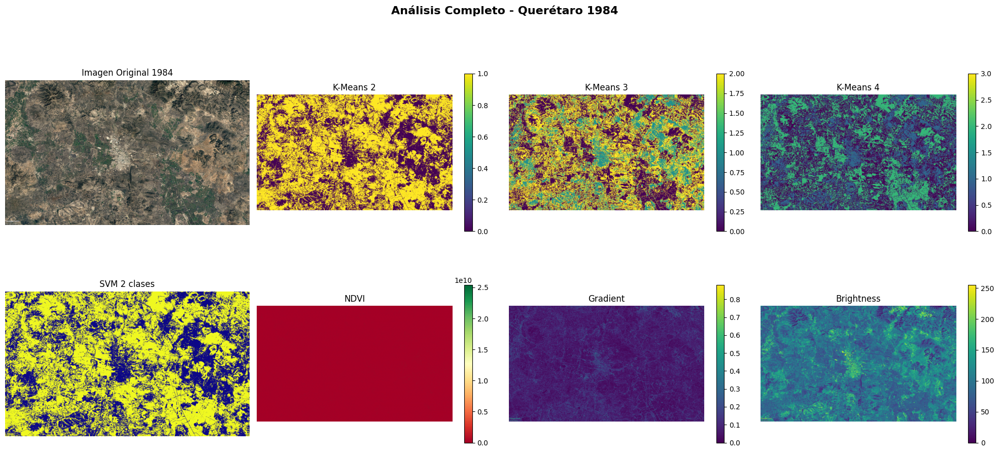

📈 Calculando estadísticas...
   📊 Vegetación aprox: 73.5%
   🏗️  Urbano aprox: 25.0%
   🌱 NDVI promedio: 83482811.411
✅ Año 1984 procesado exitosamente

🎯 PROCESANDO AÑO 2003
📷 Cargando imagen 2003...
   ✅ Imagen cargada: (1792, 3024, 3)
🎨 Extrayendo características...
   ✅ 11 características extraídas: (5419008, 11)
📐 Preprocessing...
   ✅ PCA: (5419008, 8) (varianza: 1.000)
🔍 Clustering...
   ✅ 2 clusters: [3292808 2126200]
   ✅ 3 clusters: [2472092 1001472 1945444]
   ✅ 4 clusters: [ 978393 1959879   12321 2468415]
🤖 Entrenando SVM...
   ✅ SVM 2: 0.995
   ✅ SVM 3: 0.992
   ✅ SVM 4: 0.990
📊 Creando visualización...


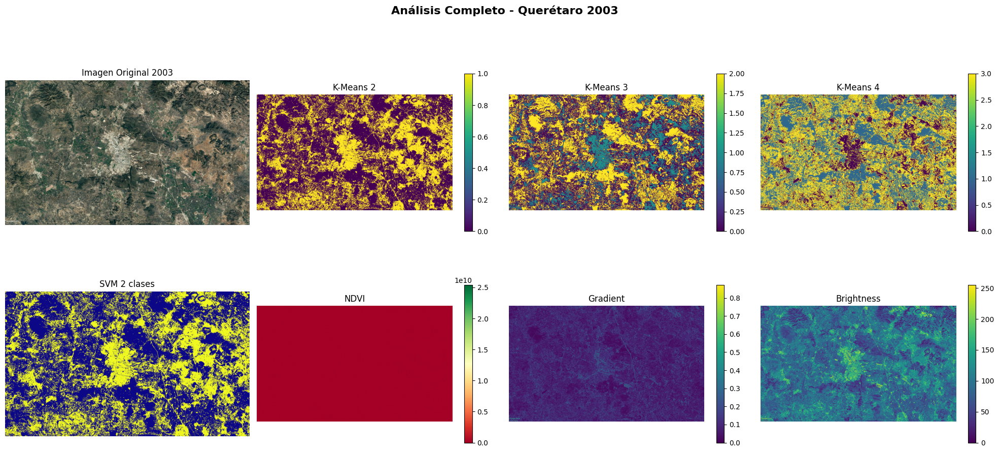

📈 Calculando estadísticas...
   📊 Vegetación aprox: 59.4%
   🏗️  Urbano aprox: 25.0%
   🌱 NDVI promedio: 56459118.720
✅ Año 2003 procesado exitosamente

🎯 PROCESANDO AÑO 2020
📷 Cargando imagen 2020...
   ✅ Imagen cargada: (1792, 3024, 3)
🎨 Extrayendo características...
   ✅ 11 características extraídas: (5419008, 11)
📐 Preprocessing...
   ✅ PCA: (5419008, 8) (varianza: 1.000)
🔍 Clustering...
   ✅ 2 clusters: [2505530 2913478]
   ✅ 3 clusters: [2159444  737308 2522256]
   ✅ 4 clusters: [ 743218 2144609 2512311   18870]
🤖 Entrenando SVM...
   ✅ SVM 2: 0.990
   ✅ SVM 3: 0.993
   ✅ SVM 4: 0.990
📊 Creando visualización...


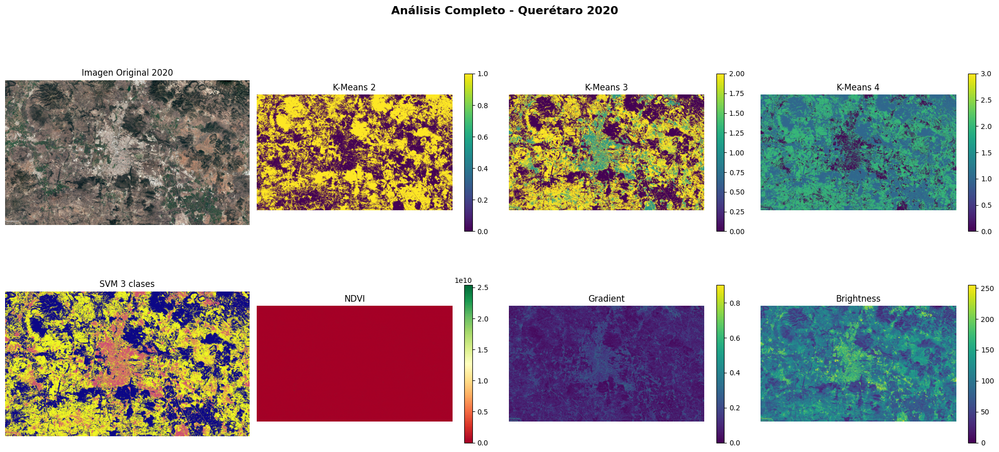

📈 Calculando estadísticas...
   📊 Vegetación aprox: 79.9%
   🏗️  Urbano aprox: 25.0%
   🌱 NDVI promedio: 84028815.453
✅ Año 2020 procesado exitosamente

📁 Guardando resumen completo...
🔄 Creando comparación temporal...


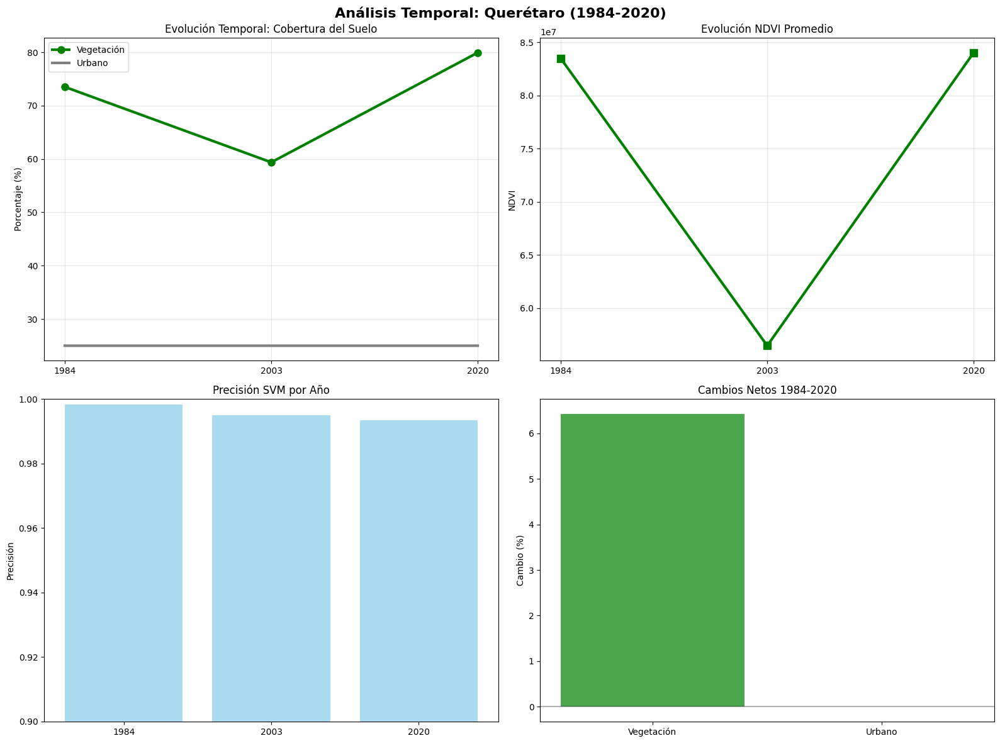


🎉 PROCESAMIENTO BATCH COMPLETADO
📁 Directorio de salida: ../data/processed/batch_all_years_20251101_192935
📊 Imágenes procesadas: 3

📈 Año 1984:
   🌿 Vegetación: 73.5%
   🏗️  Urbano: 25.0%
   🤖 Mejor SVM: 0.998

📈 Año 2003:
   🌿 Vegetación: 59.4%
   🏗️  Urbano: 25.0%
   🤖 Mejor SVM: 0.995

📈 Año 2020:
   🌿 Vegetación: 79.9%
   🏗️  Urbano: 25.0%
   🤖 Mejor SVM: 0.993

🔄 Cambios 1984-2020:
   🌿 Vegetación: +6.4%
   🏗️  Urbano: -0.0%

📁 Archivos generados:
   - batch_summary_all_years.json (metadatos)
   - analysis_XXXX.png (análisis por año)
   - temporal_comparison.png (evolución temporal)


In [26]:
# 14. Procesamiento de TODAS las imágenes (1984, 2003, 2020)
import os
from datetime import datetime

print("🚀 PROCESANDO TODAS LAS IMÁGENES DE QUERÉTARO")
print("=" * 60)

# Definir rutas de las 3 imágenes
image_paths = {
    '1984': '../data/raw/imagen_1984.png',
    '2003': '../data/raw/imagen_2003.png', 
    '2020': '../data/raw/imagen_2020.png'
}

# Verificar que existen las imágenes
print("🔍 Verificando imágenes disponibles:")
available_images = {}
for year, path in image_paths.items():
    if os.path.exists(path):
        size_mb = os.path.getsize(path) / (1024 * 1024)
        available_images[year] = path
        print(f"   ✅ {year}: {path} ({size_mb:.1f} MB)")
    else:
        print(f"   ❌ {year}: {path} (NO ENCONTRADA)")

if not available_images:
    print("❌ No se encontraron imágenes para procesar")
else:
    print(f"\n📊 Procesando {len(available_images)} imágenes...")
    
    # Crear directorio de salida con timestamp
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    batch_output_dir = f'../data/processed/batch_all_years_{timestamp}'
    os.makedirs(batch_output_dir, exist_ok=True)
    
    # Diccionario para almacenar todos los resultados
    all_results = {}
    
    # Procesar cada imagen
    for year, img_path in available_images.items():
        print(f"\n🎯 PROCESANDO AÑO {year}")
        print("=" * 40)
        
        try:
            # 1. Cargar imagen
            print(f"📷 Cargando imagen {year}...")
            img = cv2.imread(img_path)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            h, w, c = img_rgb.shape
            print(f"   ✅ Imagen cargada: {img_rgb.shape}")
            
            # 2. Extraer características rápidas
            print("🎨 Extrayendo características...")
            r, g, b = img_rgb[:,:,0], img_rgb[:,:,1], img_rgb[:,:,2]
            gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
            
            # Características básicas
            basic_feat = {
                'red': r, 'green': g, 'blue': b,
                'intensity': np.mean(img_rgb, axis=2),
                'brightness': 0.299*r + 0.587*g + 0.114*b
            }
            
            # Características de textura
            sobel_h = filters.sobel_h(gray)
            sobel_v = filters.sobel_v(gray)
            texture_feat = {
                'sobel_h': sobel_h,
                'sobel_v': sobel_v,
                'gradient': np.sqrt(sobel_h**2 + sobel_v**2)
            }
            
            # Índices espectrales
            epsilon = 1e-8
            spectral_feat = {
                'ndvi_approx': (g - r) / (g + r + epsilon),
                'excess_green': 2*g - r - b,
                'excess_red': 1.4*r - g
            }
            
            # Consolidar características
            all_features_year = {**basic_feat, **texture_feat, **spectral_feat}
            feature_matrix_year = []
            feature_names_year = list(all_features_year.keys())
            
            for name, data in all_features_year.items():
                feature_matrix_year.append(data.flatten())
            
            X_features_year = np.array(feature_matrix_year).T
            print(f"   ✅ {len(feature_names_year)} características extraídas: {X_features_year.shape}")
            
            # 3. Preprocessing
            print("📐 Preprocessing...")
            scaler_year = StandardScaler()
            X_scaled_year = scaler_year.fit_transform(X_features_year)
            
            pca_year = PCA(n_components=8)
            X_pca_year = pca_year.fit_transform(X_scaled_year)
            print(f"   ✅ PCA: {X_pca_year.shape} (varianza: {pca_year.explained_variance_ratio_.sum():.3f})")
            
            # 4. Clustering K-Means
            print("🔍 Clustering...")
            kmeans_results_year = {}
            
            for n_clusters in [2, 3, 4]:
                kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=5)
                labels = kmeans.fit_predict(X_pca_year)
                
                kmeans_results_year[n_clusters] = {
                    'model': kmeans,
                    'labels': labels,
                    'inertia': kmeans.inertia_
                }
                
                distribution = np.bincount(labels)
                print(f"   ✅ {n_clusters} clusters: {distribution}")
            
            # 5. SVM
            print("🤖 Entrenando SVM...")
            svm_results_year = {}
            
            for n_clusters, result in kmeans_results_year.items():
                labels = result['labels']
                
                # Muestra pequeña para acelerar
                sample_size = min(3000, len(labels))
                sample_idx = np.random.choice(len(labels), sample_size, replace=False)
                X_sample = X_pca_year[sample_idx]
                y_sample = labels[sample_idx]
                
                # División train/test
                from sklearn.model_selection import train_test_split
                X_train, X_test, y_train, y_test = train_test_split(
                    X_sample, y_sample, test_size=0.2, random_state=42
                )
                
                # Entrenar SVM
                svm_model = SVC(kernel='linear', C=1.0, random_state=42)
                svm_model.fit(X_train, y_train)
                
                # Evaluación
                from sklearn.metrics import accuracy_score
                y_pred = svm_model.predict(X_test)
                accuracy = accuracy_score(y_test, y_pred)
                
                svm_results_year[n_clusters] = {
                    'model': svm_model,
                    'accuracy': accuracy
                }
                print(f"   ✅ SVM {n_clusters}: {accuracy:.3f}")
            
            # 6. Crear visualización para este año
            print("📊 Creando visualización...")
            fig, axes = plt.subplots(2, 4, figsize=(20, 10))
            
            # Imagen original
            axes[0, 0].imshow(img_rgb)
            axes[0, 0].set_title(f'Imagen Original {year}')
            axes[0, 0].axis('off')
            
            # K-means results
            col = 1
            for n_clusters, result in kmeans_results_year.items():
                labels_image = result['labels'].reshape((h, w))
                im = axes[0, col].imshow(labels_image, cmap='viridis')
                axes[0, col].set_title(f'K-Means {n_clusters}')
                axes[0, col].axis('off')
                plt.colorbar(im, ax=axes[0, col], shrink=0.6)
                col += 1
            
            # SVM results
            best_svm_clusters = max(svm_results_year.keys(), key=lambda x: svm_results_year[x]['accuracy'])
            best_svm_model = svm_results_year[best_svm_clusters]['model']
            svm_pred = best_svm_model.predict(X_pca_year)
            svm_pred_image = svm_pred.reshape((h, w))
            
            axes[1, 0].imshow(svm_pred_image, cmap='plasma')
            axes[1, 0].set_title(f'SVM {best_svm_clusters} clases')
            axes[1, 0].axis('off')
            
            # Características principales
            char_names = ['NDVI', 'Gradient', 'Brightness']
            char_data = [spectral_feat['ndvi_approx'], texture_feat['gradient'], basic_feat['brightness']]
            
            for i, (name, data) in enumerate(zip(char_names, char_data)):
                if i < 3:
                    im = axes[1, i+1].imshow(data, cmap='RdYlGn' if 'NDVI' in name else 'viridis')
                    axes[1, i+1].set_title(name)
                    axes[1, i+1].axis('off')
                    plt.colorbar(im, ax=axes[1, i+1], shrink=0.6)
            
            plt.suptitle(f'Análisis Completo - Querétaro {year}', fontsize=16, fontweight='bold')
            plt.tight_layout()
            
            # Guardar visualización
            viz_path = os.path.join(batch_output_dir, f'analysis_{year}.png')
            plt.savefig(viz_path, dpi=300, bbox_inches='tight')
            plt.show()
            
            # 7. Calcular estadísticas del año
            print("📈 Calculando estadísticas...")
            
            # Estadísticas de clustering
            clustering_stats = {}
            for n_clusters, result in kmeans_results_year.items():
                labels = result['labels']
                stats = {}
                for i in range(n_clusters):
                    count = np.sum(labels == i)
                    percentage = count / len(labels) * 100
                    stats[f'cluster_{i}'] = {'count': int(count), 'percentage': float(percentage)}
                clustering_stats[n_clusters] = stats
            
            # Estadísticas espectrales aproximadas
            vegetation_approx = np.mean(spectral_feat['ndvi_approx'] > 0.1) * 100
            urban_approx = np.mean(basic_feat['brightness'] > np.percentile(basic_feat['brightness'], 75)) * 100
            
            spectral_stats = {
                'vegetation_approx': float(vegetation_approx),
                'urban_approx': float(urban_approx),
                'mean_ndvi': float(np.mean(spectral_feat['ndvi_approx'])),
                'mean_brightness': float(np.mean(basic_feat['brightness']))
            }
            
            print(f"   📊 Vegetación aprox: {vegetation_approx:.1f}%")
            print(f"   🏗️  Urbano aprox: {urban_approx:.1f}%")
            print(f"   🌱 NDVI promedio: {np.mean(spectral_feat['ndvi_approx']):.3f}")
            
            # Guardar resultados del año
            year_results = {
                'year': year,
                'image_shape': img_rgb.shape,
                'n_features': len(feature_names_year),
                'feature_names': feature_names_year,
                'clustering_stats': clustering_stats,
                'spectral_stats': spectral_stats,
                'svm_accuracies': {k: float(v['accuracy']) for k, v in svm_results_year.items()},
                'best_svm_accuracy': float(svm_results_year[best_svm_clusters]['accuracy']),
                'kmeans_inertias': {k: float(v['inertia']) for k, v in kmeans_results_year.items()}
            }
            
            all_results[year] = year_results
            print(f"✅ Año {year} procesado exitosamente")
            
        except Exception as e:
            print(f"❌ Error procesando {year}: {str(e)}")
            all_results[year] = {'year': year, 'error': str(e)}
    
    # 8. Guardar resumen de todos los años
    print(f"\n📁 Guardando resumen completo...")
    
    import json
    summary_path = os.path.join(batch_output_dir, 'batch_summary_all_years.json')
    with open(summary_path, 'w') as f:
        json.dump(all_results, f, indent=2)
    
    # 9. Crear comparación temporal
    print("🔄 Creando comparación temporal...")
    
    successful_years = [year for year, data in all_results.items() if 'error' not in data]
    
    if len(successful_years) > 1:
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        # Evolución de vegetación
        years_list = sorted(successful_years)
        vegetation_evolution = [all_results[year]['spectral_stats']['vegetation_approx'] for year in years_list]
        urban_evolution = [all_results[year]['spectral_stats']['urban_approx'] for year in years_list]
        
        axes[0, 0].plot(years_list, vegetation_evolution, 'g-o', linewidth=3, markersize=8, label='Vegetación')
        axes[0, 0].plot(years_list, urban_evolution, 'gray', linewidth=3, markersize=8, label='Urbano')
        axes[0, 0].set_title('Evolución Temporal: Cobertura del Suelo')
        axes[0, 0].set_ylabel('Porcentaje (%)')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)
        
        # Evolución NDVI
        ndvi_evolution = [all_results[year]['spectral_stats']['mean_ndvi'] for year in years_list]
        axes[0, 1].plot(years_list, ndvi_evolution, 'g-s', linewidth=3, markersize=8)
        axes[0, 1].set_title('Evolución NDVI Promedio')
        axes[0, 1].set_ylabel('NDVI')
        axes[0, 1].grid(True, alpha=0.3)
        
        # Precisión SVM por año
        svm_accuracies = {year: all_results[year]['best_svm_accuracy'] for year in years_list}
        axes[1, 0].bar(years_list, list(svm_accuracies.values()), color='skyblue', alpha=0.7)
        axes[1, 0].set_title('Precisión SVM por Año')
        axes[1, 0].set_ylabel('Precisión')
        axes[1, 0].set_ylim([0.9, 1.0])
        
        # Cambios netos
        if len(years_list) >= 2:
            inicio = years_list[0]
            final = years_list[-1]
            
            cambio_veg = all_results[final]['spectral_stats']['vegetation_approx'] - all_results[inicio]['spectral_stats']['vegetation_approx']
            cambio_urb = all_results[final]['spectral_stats']['urban_approx'] - all_results[inicio]['spectral_stats']['urban_approx']
            
            changes = [cambio_veg, cambio_urb]
            labels = ['Vegetación', 'Urbano']
            colors = ['green' if x >= 0 else 'red' for x in changes]
            
            axes[1, 1].bar(labels, changes, color=colors, alpha=0.7)
            axes[1, 1].set_title(f'Cambios Netos {inicio}-{final}')
            axes[1, 1].set_ylabel('Cambio (%)')
            axes[1, 1].axhline(y=0, color='black', linestyle='-', alpha=0.3)
        
        plt.suptitle('Análisis Temporal: Querétaro (1984-2020)', fontsize=16, fontweight='bold')
        plt.tight_layout()
        
        # Guardar comparación temporal
        temporal_path = os.path.join(batch_output_dir, 'temporal_comparison.png')
        plt.savefig(temporal_path, dpi=300, bbox_inches='tight')
        plt.show()
    
    # 10. Resumen final
    print(f"\n🎉 PROCESAMIENTO BATCH COMPLETADO")
    print("=" * 50)
    print(f"📁 Directorio de salida: {batch_output_dir}")
    print(f"📊 Imágenes procesadas: {len(successful_years)}")
    
    for year in successful_years:
        data = all_results[year]
        print(f"\n📈 Año {year}:")
        print(f"   🌿 Vegetación: {data['spectral_stats']['vegetation_approx']:.1f}%")
        print(f"   🏗️  Urbano: {data['spectral_stats']['urban_approx']:.1f}%")
        print(f"   🤖 Mejor SVM: {data['best_svm_accuracy']:.3f}")
    
    if len(successful_years) >= 2:
        print(f"\n🔄 Cambios {successful_years[0]}-{successful_years[-1]}:")
        print(f"   🌿 Vegetación: {cambio_veg:+.1f}%")
        print(f"   🏗️  Urbano: {cambio_urb:+.1f}%")
    
    print(f"\n📁 Archivos generados:")
    print(f"   - batch_summary_all_years.json (metadatos)")
    print(f"   - analysis_XXXX.png (análisis por año)")
    print(f"   - temporal_comparison.png (evolución temporal)")